# Домашнее задание №2

## Часть 1. Теоретические задачи

### Задача 1

Какая стратегия поведения в листьях регрессионного дерева приводит к меньшему матожиданию ошибки по MSE: отвечать средним значением таргета на объектах обучающей выборки, попавших в лист, или отвечать таргетом для случайного объекта из листа (считая все объекты равновероятными)?

**Решение:** Нас интересует следующая величина
$$E\left[\dfrac{1}{N}\sum(y_{i}^{*} - y_{i})^{2}\right],$$
где $y_{i}^{*}$ - предсказание на $x_{i}$.

Обозначим элементы обучающей выборки как $g_{i}$ и перепишем искомую величину в следующем виде:
$$E\left[\dfrac{1}{N}\sum(y_{i}^{*} - y_{i})^{2}\right] = \dfrac{1}{N}\sum E\left[(y_{i}^{*})^{2} - 2y_{i}^{*}y_{i} + y_{i}^{2}\right]$$
Заметим, что слагаемое $y_{i}^{*}y_{i}$ внесет одинаковый вклад в МО в обоих случаях. Разница в МО будет заключаться в слагаемых $(y_{i}^{*})^{2}$.

Случай:
1. $E(y_{i}^{*})^{2} = E\left(\dfrac{1}{K}\sum g_{j}\right)^{2} = \dfrac{1}{K^{2}}E\left(\sum g_{j}\right)^{2} = \dfrac{1}{K}Eg_{j}^{2} + \dfrac{1}{K^{2}}\sum_{i \ne j}Eg_{i}g_{j}$
2. $E(y_{i}^{*})^{2} = Eg_{j}^{2} = Dg_{j} + (Eg_{j})^{2}$, где $g_{j}$ - некоторый случайный элемент тестовой выборки.

Если предположить, что объекты тестовой выборки независимы и одинаково распределены, то:
1. $E(y_{i}^{*})^{2} = \dfrac{1}{K}Eg_{j}^{2} + \dfrac{K - 1}{K}(Eg_{i})^{2} = \dfrac{1}{K}Dg_{j} + (Eg_{j})^{2}$

Тогда видно, что в первом случае МО будет меньше.

### Задача 2

Критерий информативности для набора объектов $L$ вычисляется на основе того, насколько хорошо их целевые переменные предсказываются константой (при оптимальном выборе этой константы):
$$H(R) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} L(y_i, c),$$
где $L(y_i, c)$- некоторая функция потерь. Соответственно, чтобы получить вид критерия при конкретной функции потерь, необходимо аналитически найти оптимальное значение константы и подставить его в формулу для $H(R)$.

Выведите критерии информативности для следующих функций потерь:
1. $L(y,c) = (y-c)^2$
2. $L(y,c) = \sum_{k=1}^K (c_k-[y=k])^2$
3. $L(y,c) = -\sum_{k=1}^K [y=k]\log c_k$

**Решение:**
* $L(y, c) = (y - c)^{2}$

$$H(R) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} L(y_{i}, c) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} (y_{i} - c)^{2} = \min_{c \in Y} F_{c}(R)$$
Чтобы найти минимум, посчитаем производную:
$$F_{c}'(R) = \dfrac{2}{|R|} \sum_{(x_{i}, y_{i}) \in R} (y_{i} - c) = 0$$
$$\implies c = \overline{y}$$
Тогда критерий информативности примет вид:
$$H(R) = \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} (y_{i} - \overline{y})^{2} = \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} y_{i}^{2} - 2 \ \overline{y} \ \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} y_{i} + \overline{y}^{2}$$
$$= \overline{y^{2}} - \overline{y}^{2} = D(y)$$

* $L(y, c) = \sum_{k = 1}^{K} (c_{k} - [y = k])^{2}$

$$H(R) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} L(y_{i}, c) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} \left(\sum_{k = 1}^{K} (c_{k} - [y_{i} = k])^{2}\right)$$
$$= \min_{c \in Y} \sum_{k = 1}^{K} \left(\dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} (c_{k} - [y_{i} = k])^{2}\right) = \min_{c \in Y} \sum_{k = 1}^{K} F_{c_{k}}(R)$$
Чтобы найти минимум, найдем минимум для каждой компоненты вектора $c$. Для этого посчитаем производную:
$$F_{c_{k}}'(R) = \dfrac{2}{|R|} \sum_{(x_{i}, y_{i}) \in R} (c_{k} - [y_{i} = k]) = 0$$
$$\implies c_{k} = p_{k},$$
где $p_{k}$ - доля элементов в $k$-ом классе.

Критерий информативности в данном случае будет выглядеть следующим образом:
$$H(R) = \sum_{k = 1}^{K} \left(\dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} (p_{k} - [y_{i} = k])^{2}\right) = \sum_{k = 1}^{K} \left(p_{k}^{2} - 2 \ p_{k} \ \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} [y_{i} = k] + \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} [y_{i} = k]^{2}\right)$$
$$=\sum_{k = 1}^{K} \left(p_{k}^{2} - 2 \ p_{k}^{2} + \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} [y_{i} = k]\right) =\sum_{k = 1}^{K} p_{k}(1 - p_{k})$$

* $L(y, c) = -\sum_{k = 1}^{K} [y = k]\log c_{k}$

$$H(R) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} L(y_{i}, c) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} \left(-\sum_{k = 1}^{K} [y_{i} = k]\log c_{k}\right)$$
$$= \min_{c \in Y} \sum_{k = 1}^{K} \left(- \dfrac{1}{|R|} \sum_{(x_{i}, y_{i}) \in R} [y_{i} = k]\log c_{k}\right) = \min_{c \in Y} \sum_{k = 1}^{K} - p_{k}\log c_{k}$$
Определим $c_{k}$. Будем предполагать, что $\sum c_{k} = 1$. Будем считать, что зафиксированы уже все $c_{k}$, кроме $c_{1}$ и $c_{2}$, и $c_{1} + c_{2} = a$. Тогда
$$H(R) = \min_{(c_{1},c_{2}) \in Y^{2}} \sum_{k = 1}^{2} - p_{k}\log c_{k} + const = const + \min_{(c_{1},c_{2}) \in Y^{2}} \left[-p_{1}\log c_{1} - p_{2}\log (a - c_{1})\right]$$
Для поиска минимума возьмем производную:
$$H'(R) = -\dfrac{p_{1}}{c_{1}} + \dfrac{p_{2}}{a - c_{1}} = 0$$
$$\implies c_{1} = \dfrac{ap_{1}}{p_{1} + p_{2}}; c_{2} = \dfrac{ap_{2}}{p_{1} + p_{2}}$$
$$\implies \dfrac{c_{1}}{c_{2}} = \dfrac{p_{1}}{p_{2}}$$
Так как индексы 1 и 2 были выбраны произвольно, получаем, что
$$\dfrac{c_{i}}{c_{j}} = \dfrac{p_{i}}{p_{j}}$$
Складывая такие отношения при фиксированных $j$ получим
$$\dfrac{\sum c_{i}}{c_{j}} = \dfrac{1}{c_{j}} = \dfrac{1}{p_{j}} = \dfrac{\sum p_{i}}{p_{j}}$$
$$\implies c_{j} = p_{j}$$
Тогда критерий информативности примет следующий вид
$$H(R) = \sum_{k = 1}^{K} - p_{k}\log p_{k}$$

### Задача 3

Запишите оценку сложности построения одного решающего дерева в зависимости от размера обучающей выборки $l$, числа признаков $d$, максимальной глубины дерева $D$. В качестве предикатов используются пороговые функции $[x_j>t]$. При выборе предиката в каждой вершине перебираются все признаки, а в качестве порогов рассматриваются величины $t$, равные значения этого признака на объектах, попавших в текущую вершину. Считайте сложность вычисления критерия информативности константной.

**Решение:** На нулевом уровне будет выполнено $dl$ операций. Пусть после этого выборка поделится на $k_{1}$ и $k_{2}$, причем $l = k_{1} + k_{2}$. На первом уровне будет выполнено $dk_{1} + dk_{2} = dl$ операций. Продолжая так дальше получим, что на $i$-ом уровне суммарно будет выполнено $dl$ операций. Тогда, так как максимальная глубина дерева равна $D$, то сложность алгоритма составит $O(Ddl)$.

## Часть 2. Визуализация решающих деревьев

Постройте решающее дерево из sklearn на датасете [Car Evaluation Dataset](https://archive.ics.uci.edu/ml/datasets/car+evaluation).

In [1]:
import IPython.display
import pydot

import pandas as pd

from io import StringIO
from sklearn import tree

In [2]:
columns = ['buying', 'maint', 'doors', 'persons',
           'lug_boot', 'safety', 'values']

class_names = ['unacc', 'acc', 'good', 'vgood']

buying = {'vhigh': 0, 'high': 1, 'med': 2, 'low': 3}
maint = {'vhigh': 0, 'high': 1, 'med': 2, 'low': 3}
doors = {'2': 0, '3': 1, '4': 2, '5more': 3}
persons = {'2': 0, '4': 1, 'more': 2}
lug_boot = {'small': 0, 'med': 1, 'big': 2}
safety = {'low': 0, 'med': 1, 'high': 2}
values = {'unacc': 0, 'acc': 1, 'good': 2, 'vgood': 3}

In [3]:
data = pd.read_csv('car.data', names=columns)

In [4]:
data.head()

,buying,maint,doors,persons,lug_boot,safety,values
0,vhigh,vhigh,2,2,small,low,unacc
1,vhigh,vhigh,2,2,small,med,unacc
2,vhigh,vhigh,2,2,small,high,unacc
3,vhigh,vhigh,2,2,med,low,unacc
4,vhigh,vhigh,2,2,med,med,unacc


In [5]:
data['buying'] = data['buying'].apply(lambda x: buying[x])
data['maint'] = data['maint'].apply(lambda x: maint[x])
data['doors'] = data['doors'].apply(lambda x: doors[x])
data['persons'] = data['persons'].apply(lambda x: persons[x])
data['lug_boot'] = data['lug_boot'].apply(lambda x: lug_boot[x])
data['safety'] = data['safety'].apply(lambda x: safety[x])
data['values'] = data['values'].apply(lambda x: values[x])

In [6]:
data.head()

,buying,maint,doors,persons,lug_boot,safety,values
0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0
2,0,0,0,0,0,2,0
3,0,0,0,0,1,0,0
4,0,0,0,0,1,1,0


In [7]:
model = tree.DecisionTreeClassifier()
model.fit(data.iloc[:, :-1], data['values'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

Визуализируйте получившееся дерево с помощью GraphViz.

In [8]:
def draw_decision_tree(clf, feature_names, class_names):
    dot_data = StringIO()
    tree.export_graphviz(clf, out_file=dot_data,
                         feature_names=feature_names,
                         class_names=class_names,
                         filled=True, rounded=True,
                         special_characters=True)
    graph = pydot.graph_from_dot_data(dot_data.getvalue())
    a = IPython.display.Image(graph[0].create_png())
    IPython.display.display(a)

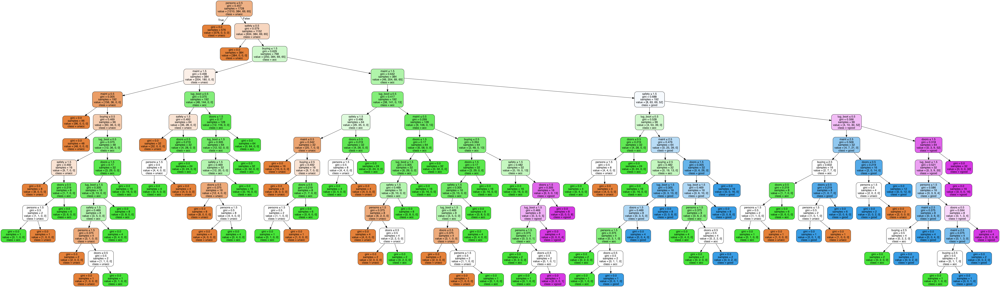

In [9]:
draw_decision_tree(model, columns[:-1], class_names)

Посмотрите, как меняется картинка для различных значений структурных параметров (варьируйте параметры max_depth, criterion, min_samples_leaf, max_features). Убедитесь, что увеличение глубины дерева и уменьшение количества объектов в листьях способствует гибкости модели и, как следствие, переобучению (что соответствует интуитивным соображениям о структуре дерева).

**Разные параметры**

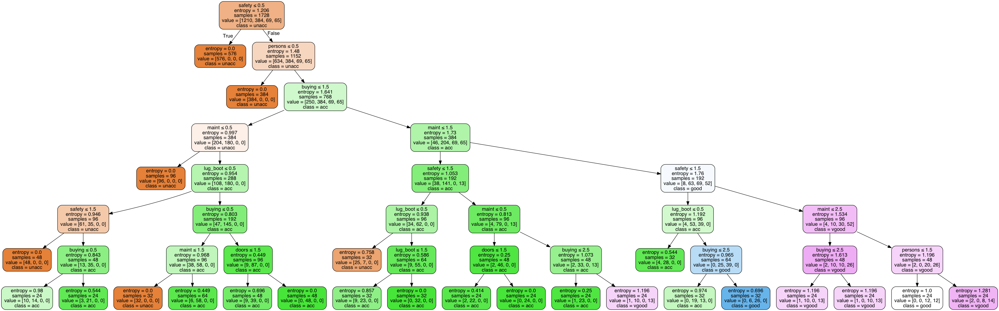

In [10]:
model = tree.DecisionTreeClassifier(min_samples_leaf=21, max_depth=7,
                                    criterion='entropy', max_features=4)
model.fit(data.iloc[:, :-1], data['values'])
draw_decision_tree(model, columns[:-1], class_names)

**Изменение min_samples_leaf**

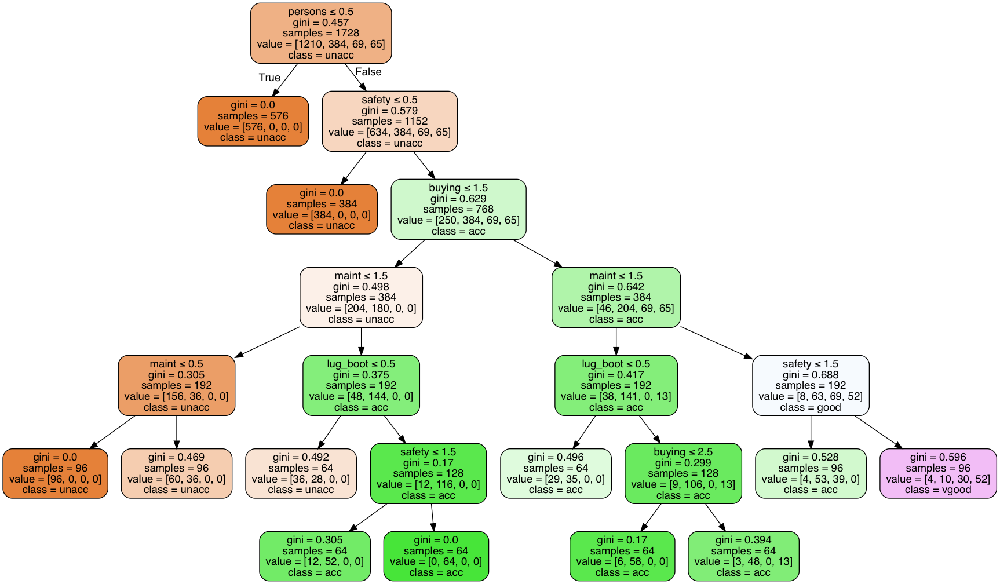

In [11]:
model = tree.DecisionTreeClassifier(min_samples_leaf=64)
model.fit(data.iloc[:, :-1], data['values'])
draw_decision_tree(model, columns[:-1], class_names)

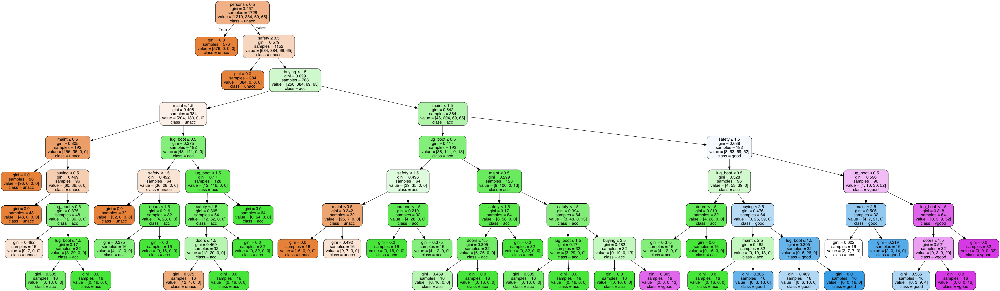

In [12]:
model = tree.DecisionTreeClassifier(min_samples_leaf=16)
model.fit(data.iloc[:, :-1], data['values'])
draw_decision_tree(model, columns[:-1], class_names)

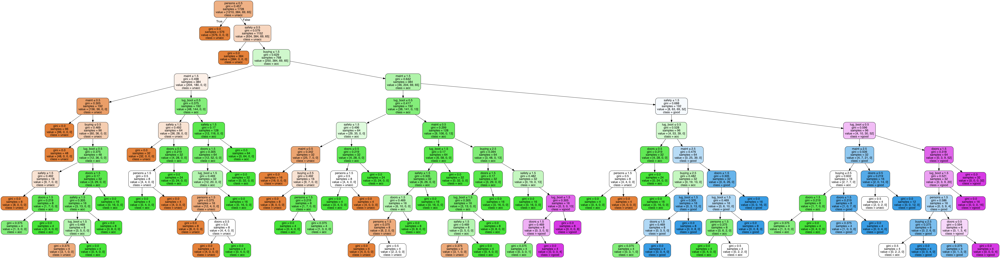

In [13]:
model = tree.DecisionTreeClassifier(min_samples_leaf=4)
model.fit(data.iloc[:, :-1], data['values'])
draw_decision_tree(model, columns[:-1], class_names)

**Изменение max_depth**

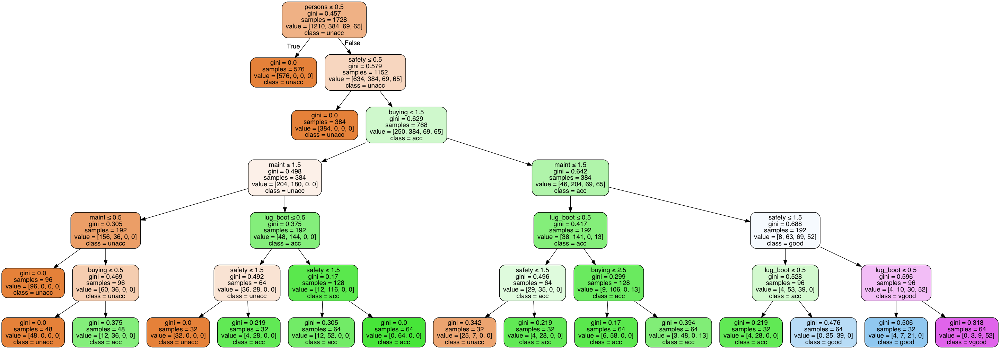

In [14]:
model = tree.DecisionTreeClassifier(max_depth=6)
model.fit(data.iloc[:, :-1], data['values'])
draw_decision_tree(model, columns[:-1], class_names)

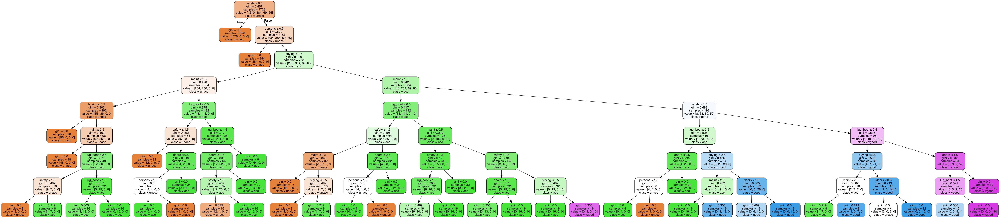

In [15]:
model = tree.DecisionTreeClassifier(max_depth=8)
model.fit(data.iloc[:, :-1], data['values'])
draw_decision_tree(model, columns[:-1], class_names)

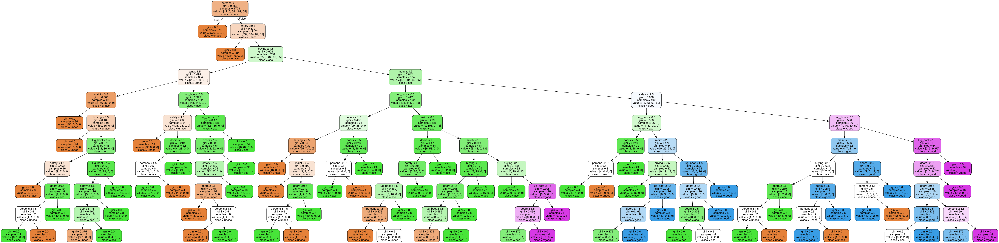

In [16]:
model = tree.DecisionTreeClassifier(max_depth=10)
model.fit(data.iloc[:, :-1], data['values'])
draw_decision_tree(model, columns[:-1], class_names)

**Вывод:** Видно, что при большой глубине и малом количестве объектов в листьях происходит переобучение.

## Часть 3. Реализация алгоритма построения дерева решений

In [17]:
import warnings

import numpy as np

from matplotlib import pyplot as plt
from sklearn.base import BaseEstimator
from sklearn.datasets import make_classification, make_regression, load_digits, load_boston
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, mean_squared_error

%matplotlib inline

In [18]:
warnings.simplefilter("ignore")

Зафиксируем заранее `random_state` (a.k.a. random seed). Это должно повысить вероятность полной воспроизводимости результатов, впрочем, замечено, что тем не менее небольшие флуктуации возможны (например, качества прогнозов дерева, которое мы сейчас вырастим) в случае разных ОС.

In [19]:
RANDOM_STATE = 42

**Необходимо реализовать класс `DecisionTree`**

**Спецификация:**
- класс наследуется от `sklearn.BaseEstimator`;
- конструктор содержит следующие параметры: 
    `max_depth` - максимальная глубина дерева (по умолчанию - `numpy.inf`); 
    `min_samples_split` - минимальное число объектов в вершине, при котором происходит её разбиение (по умолчанию - 2); 
    `criterion` - критерий разбиения (для классификации - 'gini' или 'entropy', для регрессии - 'variance' или 'mad_median'; 
    по умолчанию - 'gini');
    
    Функционал, значение которого максимизируется для поиска оптимального разбиения в данной вершине имеет вид
    $$Q(X, j, t) = F(X) - \dfrac{|X_l|}{|X|} F(X_l) - \dfrac{|X_r|}{|X|} F(X_r),$$
    где $X$ - выборка, находящаяся в текущей вершине, $X_l$ и $X_r$ - разбиение выборки $X$ на две части 
    по предикату $[x_j < t]$, а $F(X)$ -критерий разбиения.
    
    1. Для классификации: пусть $p_i$ - доля объектов $i$-го класса в выборке $X$.
    
        - 'gini': Неопределенность Джини $F(X) = 1 -\sum_{i = 1}^K p_i^2$.
    
        - 'entropy': Энтропия $F(X) = -\sum_{i = 1}^K p_i \log_2(p_i)$.
    
    2. Для регрессии: $y_j = y(x_j)$ - ответ на объекте $x_j$, $y = (y_1, \dots, y_{|X|})$ - вектор ответов.
    
        - 'variance': Дисперсия (среднее квадратичное отклонение от среднего) $F(X) = \dfrac{1}{|X|} \sum_{x_j \in X}(y_j - \dfrac{1}{|X|}\sum_{x_i \in X}y_i)^2$
    
        - 'mad_median': Среднее отклонение от медианы $F(X) = \dfrac{1}{|X|} \sum_{x_j \in X}|y_j - \mathrm{med}(y)|$
    
- класс имеет методы `fit`, `predict` и `predict_proba`;
- метод `fit` принимает матрицу объектов `X` и вектор ответов `y` (объекты `numpy.ndarray`) и возвращает экземпляр класса
    `DecisionTree`, представляющий собой решающее дерево, обученное по выборке `(X, y)` с учётом заданных в конструкторе параметров; 
- метод `predict_proba` принимает матрицу объектов `X` и возвращает матрицу `P` размера `X.shape[0] x K`, где `K` - число классов, такую что $p_{ij}$ есть вероятность принадлежности объекта, заданного $i$-ой строкой матрицы X к классу $j \in \{1, \dots, K\}$.
- метод `predict` принимает матрицу объектов и возвращает вектор предсказанных ответов; в случае классификации - это 
    наиболее многочисленный класс в листе, в который попал объект, а в случае регрессии - среднее значение ответов по 
    всем объектам этого листа;

**Советы по реализации:**

- Обучение дерева можно реализовать простым жадным рекурсивным алгоритмом: каждый раз выбирать наилучшее разбиение (номер признака и порог по нему).
- Если возможных порогов для разбиения будет слишком много, выбор наилучшего разбиения окажется вычислительно очень громоздкой задачей. Можно ограничить множество порогов любым удобным способом (например, посчитать квантили значений каждого признака или просто взяв случайный набор порогов).
- Лучше не подсматривать решение в готовых нагугленных вариантах. От вас требуется сделать всего лишь максимально простую реализацию того, как строится и применяется решающее дерево, а не применимую на практике универсальную библиотеку.

### Реализация

In [20]:
def entropy(y): 
    unique = np.unique(y, return_counts=True)[1]
    p = unique / len(y)
    
    return -np.sum(p * np.log(p))

def gini(y):
    unique = np.unique(y, return_counts=True)[1]
    p = unique / len(y)
    
    return 1 - np.sum(p ** 2)

def variance(y):
    if len(y) == 0:
        return 0
    
    score = np.sum((y - np.mean(y)) ** 2, axis=-1)
    
    return score / len(y)

def mad_median(y):
    if len(y) == 0:
        return 0
    
    score = np.sum(abs(y - np.median(y)), axis=-1)
    
    return score / len(y)

In [21]:
class DecisionTree(BaseEstimator):
    def __init__(self, max_depth=np.inf, min_samples_split=2, criterion='gini', debug=False):
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.criterion = criterion
        self.tree = []
        
    def run_fit(self, X, y, depth):
        params = (None, None, None, None, None, None)
        best = 0
        flag = 0
        
        if depth < self.max_depth and len(y) >= self.min_samples_split:
            for i in range(X.shape[1]):
                if len(set(X[:, i])) > 1:
                    for j in set(X[:, i]):
                        left_data = X[X[:, i] < j]
                        left_target = y[X[:, i] < j]
                        right_data = X[X[:, i] >= j]
                        right_target = y[X[:, i] >= j]
                    
                        q = self.func(y) - \
                            len(left_target) * self.func(left_target) / len(y) -\
                            len(right_target) * self.func(right_target) / len(y)
                    
                        if q >= best and len(left_target) > 0 and len(right_target) > 0:
                            flag = 1
                            best = q
                            params = (i, j, left_data, left_target,
                                      right_data, right_target)
                            
            if flag == 1:     
                self.run_fit(params[2], params[3], depth + 1)
                left_index = len(self.tree)
            
                self.run_fit(params[4], params[5], depth + 1)
                right_index = len(self.tree)
            
                self.tree += [(params[0], params[1], left_index - 1, right_index - 1)]
        else:
            self.tree += [y]
    
    def fit(self, X, y):
        self.classes_num = len(set(y))
        self.classes = set(y)
        if self.criterion == 'gini':
            self.func = gini
        elif self.criterion == 'entropy':
            self.func = entropy
        elif self.criterion == 'variance':
            self.func = variance
        elif self.criterion == 'mad_median':
            self.func = mad_median
        self.run_fit(X, y, 0)
        return self
    
    def predict(self, X):
        out = []
        
        for x in X:
            node = self.tree[-1]
            tmp = []
            while isinstance(node, tuple):
                if x[node[0]] < node[1]:
                    node = self.tree[node[2]]
                else:
                    node = self.tree[node[3]]
            if self.criterion == 'gini' or self.criterion == 'entropy':
                for element in self.classes:
                    tmp += [list(node).count(element) / len(node)]
                out += [np.argmax(tmp)]
            elif self.criterion == 'variance' or self.criterion == 'mad_median':
                out += [np.mean(node)]
        
        return out
            
    def predict_proba(self, X):
        out = []
        
        for x in X:
            node = self.tree[-1]
            tmp = []
            while isinstance(node, tuple):
                if x[node[0]] < node[1]:
                    node = self.tree[node[2]]
                else:
                    node = self.tree[node[3]]
            for element in self.classes:
                tmp += [list(node).count(element) / len(node)]
            out += [tmp]
        
        return out

## Тестирование реализованного алгоритма

### Классификация

С помощью метода `load_digits` загрузите датасет `digits`. Разделите выборку на обучающую и тестовую с помощью метода `train_test_split`, используйте значения параметров `test_size=0.2`, `random_state=42`. Попробуйте обучить неглубокие решающие деревья и убедитесь, что критерии gini и entropy дают разные результаты.

In [38]:
digits = load_digits()
X_train, X_test, y_train, y_test = train_test_split(digits.data,
                                                    digits.target,
                                                    test_size=0.2,
                                                    random_state=RANDOM_STATE)

In [23]:
clf = DecisionTree(max_depth=3, criterion='gini')
clf.fit(X_train, y_train)
print(clf.tree[:3])

[array([5, 5, 5, 5, 5, 5, 5, 2, 9, 5, 5, 5, 5]), array([9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 3, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 5, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
       9, 9]), (21, 7.0, 0, 1)]


In [24]:
clf = DecisionTree(max_depth=3, criterion='entropy')
clf.fit(X_train, y_train)
print(clf.tree[:3])

[array([3, 3, 3, 3, 3, 3, 9, 3, 3, 3, 9, 3, 3, 3, 3, 3, 3, 9, 9, 3, 1, 2,
       9, 3, 9, 9, 3, 3, 3, 9, 9, 3, 3, 3, 9, 3, 3, 3, 9, 3, 3, 2, 3, 3,
       9, 3, 3, 3, 3, 9, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 9, 3,
       3, 9, 9, 3, 3, 9, 3, 3, 3, 3, 9, 9, 3, 3, 3, 3, 7, 2, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 9, 3, 9, 9, 3, 1, 9, 9, 3, 9, 2, 2, 3, 9,
       9, 3, 3, 3, 3, 3, 3, 9, 1, 3, 3, 9, 9, 3, 3, 3, 0, 3, 3, 9, 3, 1,
       3, 9, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 9, 3, 3, 9, 9, 3, 1, 2, 3, 3,
       3, 9, 3, 3, 1, 3, 3, 3, 9, 3, 1, 0, 2, 3, 3, 3, 3, 3, 3, 9, 2, 7,
       3, 3, 3]), array([5, 9, 9, 4, 1, 7, 5, 1, 5, 9, 9, 9, 5, 9, 5, 5, 5, 5, 5, 9, 9, 1,
       3, 3, 5, 9, 4, 1, 5, 1, 9, 9, 5, 5, 9, 3, 9, 9, 9, 5, 5, 9, 1, 5,
       9, 5, 5, 9, 1, 9, 5, 1, 9, 9, 5, 4, 5, 1, 9, 5, 4, 5, 3, 5, 9, 7,
       5, 9, 1, 9, 5, 9, 5, 9, 1, 9, 5, 5, 5, 5, 7, 5, 9, 9, 9, 1, 5, 5,
       9, 9, 9, 5, 9, 5, 5, 3, 9, 5, 7, 9, 9, 5, 5, 1, 5, 9, 9, 5, 5, 4,
       9, 1, 1, 9, 9, 5, 3, 5, 1

**Вывод:** Видим, что получаются разные деревья.

С помощью 5-кратной кросс-валидации (`GridSearchCV`) подберите оптимальное значение параметров `max_depth` и `criterion`. Для параметра `max_depth` используйте диапазон значений - range(3, 11), а для criterion - {'gini', 'entropy'}. Критерий качества `scoring`='accuracy'.

In [25]:
parameters = {'max_depth': range(3, 11), 'criterion': ['gini', 'entropy']}
clf = GridSearchCV(DecisionTree(), parameters, cv=5, scoring='accuracy')
clf.fit(X_train, y_train, )

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTree(criterion='gini', debug=None, max_depth=inf, min_samples_split=2),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(3, 11), 'criterion': ['gini', 'entropy']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

Постройте графики средних значений критерия качества `accuracy` для критериев `gini` и `entropy` в зависимости от `max_depth`.

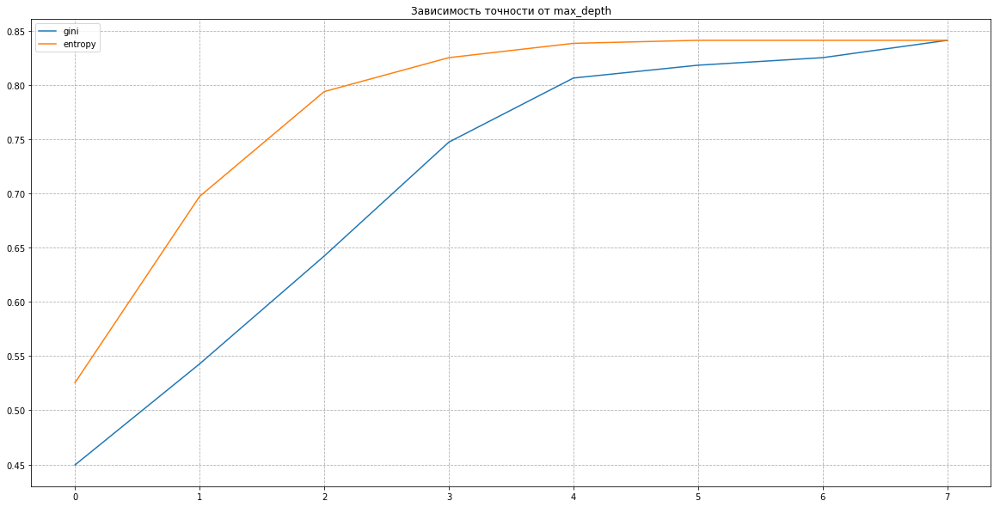

In [26]:
plt.figure(figsize=(20,10))
plt.plot(clf.cv_results_['mean_test_score'][:8], label='gini')
plt.plot(clf.cv_results_['mean_test_score'][8:], label='entropy')
plt.title('Зависимость точности от max_depth')
plt.legend()
plt.grid(ls='--')
plt.show()

Проанализируйте полученные графики. Чему равны найденные оптимальные значения параметров max_depth и criterion?

In [27]:
clf.best_estimator_

DecisionTree(criterion='gini', debug=None, max_depth=10, min_samples_split=2)

**Вывод:** На графике видно, что с `entropy` можно добиться большей точности при глубине дерева меньше 10. На самом деле лучший результат достигается с `gini` на глубине 10.

Используя найденные оптимальные значения max_depth и criterion, обучите решающее дерево на X_train, y_train и вычислите вероятности принадлежности к классам для X_test.

In [39]:
clf = DecisionTree(max_depth=10, criterion='gini')
clf.fit(X_train, y_train)

DecisionTree(criterion='gini', debug=None, max_depth=10, min_samples_split=2)

In [56]:
proba = clf.predict_proba(X_test)
print(proba[:10])

[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0], [0.0, 0.014084507042253521, 0.0, 0.0, 0.014084507042253521, 0.0, 0.0, 0.014084507042253521, 0.0, 0.9577464788732394], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0], [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]]


Для полученной матрицы вычислите усредненные по всем объектам из `X_test` значения вероятностей принадлежности к классам.

In [54]:
np.mean(proba, axis=0)

array([0.08333333, 0.07420683, 0.08602932, 0.11267769, 0.14270984,
       0.12075866, 0.09166667, 0.10973806, 0.07276626, 0.10611335])

Чему примерно равна максимальная вероятность в полученном векторе?

**Ответ:** Максимальная вероятность есть примерно 0.14. Ей соответствует цифра 4.

### Регрессия

С помощью метода `load_boston` загрузите датасет `boston`. Разделите выборку на обучающую и тестовую с помощью метода `train_test_split`, используйте значения параметров `test_size=0.2`, `random_state=42`. Попробуйте обучить неглубокие регрессионные деревья и убедитесь, что критерии `variance` и `mad_median` дают разные результаты.

In [31]:
boston = load_boston()
X_train, X_test, y_train, y_test = train_test_split(boston.data,
                                                    boston.target,
                                                    test_size=0.2,
                                                    random_state=RANDOM_STATE)

In [32]:
clf = DecisionTree(max_depth=3, criterion='variance')
clf.fit(X_train, y_train)
print(clf.tree[:3])

[array([50. , 50. , 27.9, 50. ]), array([19.9, 19.4, 18.2, 24.6, 21.1, 24.7, 20.7, 36.2, 21.8, 23.7, 17.6,
       24.4, 19.2, 25.3, 20.4, 23.1, 22.6, 14.5, 16.1, 20.6, 31.6, 29.1,
       22.5, 19.4, 20.6, 28.7, 21.2, 19.3, 23.1, 25. , 29.6, 18.7, 21.7,
       23.1, 22.8, 21. , 20.1, 19.8, 21. , 23.2, 18.5, 29.4, 24.4, 33.1,
       22. , 19.9, 23.8, 31.1, 26.2, 22.9, 15.3, 27.5, 22.9, 24.5, 25. ,
       24.1, 22.1, 19.3, 26.4, 21.8, 21.7, 20. , 20.5, 23.2, 19.6, 22.8,
       22.9, 24.3, 21.5, 24.6, 26.4, 23.1, 19.3, 23.9, 24.7, 23.8, 27.1,
       24.8, 21.4, 23.3, 32. , 30.1, 32.5, 24.3, 20.6, 22. , 18.2, 15. ,
       20.1, 28.4, 30.1, 20.8, 23. , 17.1, 23. , 22.7, 21.7, 16.1, 16.5,
       22.2, 20.6, 23.8, 22.7, 22. , 18.6, 18.7, 22. , 20.4, 23.1, 21.2,
       23.5, 26.6, 22.2, 23.3, 18.9, 18.4, 26.6, 28.4, 20.5, 22. , 29.9,
       26.6, 24.4, 21.9, 27.5, 28.1, 19.1, 27.9, 25. , 22.2, 24.3, 22.3,
       22.2, 23. , 24.8, 18.2, 19.9, 23.3, 35.1, 22. , 18.5, 25.1, 28.6,
       19.5, 24.8

In [33]:
clf = DecisionTree(max_depth=3, criterion='mad_median')
clf.fit(X_train, y_train)
print(clf.tree[:3])

[array([24.6, 24.7, 20.7, 23.7, 24.4, 25.3, 20.4, 23.1, 22.6, 29.1, 22.5,
       28.7, 23.1, 25. , 23.1, 29.4, 24.4, 50. , 26.2, 22.9, 24.1, 22.1,
       50. , 23.2, 24.3, 24.6, 23.9, 27.1, 23.3, 30.1, 32.5, 30.1, 22.2,
       18.6, 23.5, 26.6, 23.3, 28.4, 26.6, 21.9, 27.9, 22.3, 22.2, 23. ,
       22. , 28.6, 24.8, 22.9, 24.1, 24.7, 28. , 25. , 23.7, 32. , 23.3,
       27. , 30.5, 23.9, 22.8, 29.8, 24.5]), array([19.9, 19.4, 18.2, 21.1, 36.2, 21.8, 17.6, 19.2, 14.5, 16.1, 20.6,
       19.4, 20.6, 21.2, 19.3, 29.6, 18.7, 21.7, 22.8, 21. , 20.1, 19.8,
       21. , 23.2, 18.5, 22. , 19.9, 23.8, 22.9, 15.3, 24.5, 25. , 19.3,
       26.4, 21.8, 21.7, 20. , 20.5, 19.6, 22.8, 22.9, 21.5, 26.4, 23.1,
       19.3, 24.7, 23.8, 24.8, 21.4, 24.3, 20.6, 22. , 18.2, 15. , 20.1,
       28.4, 20.8, 23. , 17.1, 23. , 22.7, 21.7, 16.1, 16.5, 20.6, 23.8,
       22.7, 22. , 18.7, 22. , 20.4, 23.1, 21.2, 22.2, 18.9, 18.4, 20.5,
       24.4, 27.5, 28.1, 19.1, 25. , 22.2, 24.3, 18.2, 19.9, 27.9, 23.3,
     

С помощью 5-кратной кросс-валидации подберите оптимальное значение параметров `max_depth` и `criterion`. Для параметра `max_depth` используйте диапазон значений - `range(2, 9)`, а для `criterion` - {'variance', 'mad_median'}. Критерий качества `scoring`='neg_mean_squared_error'.

In [34]:
parameters = {'max_depth': range(2, 9), 'criterion': ['variance', 'mad_median']}
clf = GridSearchCV(DecisionTree(), parameters, cv=5, scoring='neg_mean_squared_error')
clf.fit(digits.data, digits.target)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTree(criterion='gini', debug=None, max_depth=inf, min_samples_split=2),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(2, 9), 'criterion': ['variance', 'mad_median']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='neg_mean_squared_error', verbose=0)

Постройте графики средних значений критерия качества `neg_mean_squared_error` для критериев `variance` и `mad_median` в зависимости от `max_depth`.

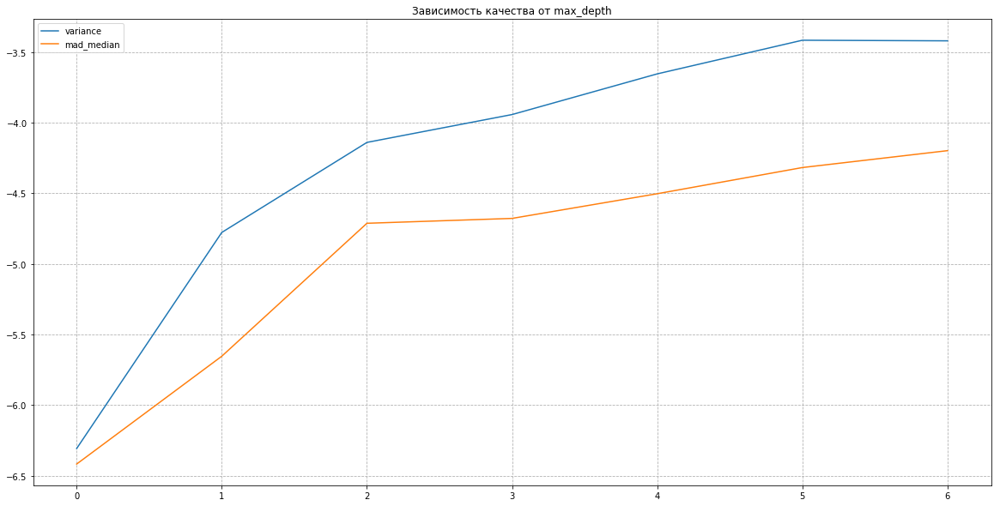

In [37]:
plt.figure(figsize=(20,10))
plt.plot(clf.cv_results_['mean_test_score'][:7], label='variance')
plt.plot(clf.cv_results_['mean_test_score'][7:], label='mad_median')
plt.title('Зависимость качества от max_depth')
plt.legend()
plt.grid(ls='--')
plt.show()

Проанализируйте полученные графики. Чему равны найденные оптимальные значения параметров max_depth и criterion?

In [36]:
clf.best_estimator_

DecisionTree(criterion='variance', debug=None, max_depth=7,
       min_samples_split=2)

**Вывод:** На графике отчетливо видно, что с `variance` можно добиться большей точности.